In [1]:
from __future__ import print_function
import argparse
import os
import random
import torch
import torch.nn as nn
import torch.nn.parallel
import torch.backends.cudnn as cudnn
import torch.optim as optim
import torch.utils.data
import torchvision.datasets as Dataset
import torchvision.transforms as transforms
import torchvision.utils as vutils
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML
import pickle
from torch.utils.data import Subset
device=torch.device('cuda' if torch.cuda.is_available() else 'cpu')
from FID import fidScore

In [2]:
lr = 0.0002
batch_size = 128
image_size = 64
image_channels = 3
z_dim = 100
epochs = 40
disc_features = 64
gen_features = 64
BETA1 = 0.55

### Downloading Images

In [3]:
transform = transforms.Compose([
    transforms.Resize(image_size),
    transforms.ToTensor(),
    transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
])

train_Dataset = Dataset.CIFAR10('./data', download=True, transform=transform)
test_Dataset = Dataset.CIFAR10('./data', download=True, train=False, transform=transform)
train_Dataset=train_Dataset+test_Dataset
train_Dataloader = torch.utils.data.DataLoader(train_Dataset, shuffle=True, batch_size=batch_size)

Files already downloaded and verified
Files already downloaded and verified


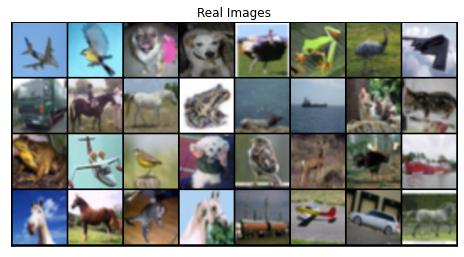

In [4]:
def display_images(images, title, figsize=(8,8), nrow=8):
    images = vutils.make_grid(images, nrow, normalize=True)
    images=images.numpy()
    images=np.transpose(images, (1,2,0))
    plt.figure(figsize=figsize)
    plt.imshow(images)
    plt.xticks([])
    plt.yticks([])
    plt.title(title)
    plt.show()

images, labels = next(iter(train_Dataloader))
display_images(images[:32], 'Real Images')

### Generator Model

In [5]:
class Generator_Model(nn.Module):
    def __init__(self):
        super(Generator_Model, self).__init__()
        self.net = nn.Sequential(
            nn.ConvTranspose2d(z_dim, gen_features*16, 4, 1, 0, bias=False),
            self._block(gen_features*16, gen_features*8, 4, 2, 1),        
            self._block(gen_features*8, gen_features*4, 4, 2, 1),       
            self._block(gen_features*4, gen_features*2, 4, 2, 1),            
            nn.ConvTranspose2d(gen_features*2, image_channels, 4, 2, 1), 
            nn.Tanh()   
        )
        
    def _block(self, in_channels, out_channels, kernel, stride, padding):
        return nn.Sequential(nn.ConvTranspose2d(in_channels, out_channels, kernel, stride, padding, bias=False),
                             nn.BatchNorm2d(out_channels),
                             nn.ReLU()
                            )
    
    def forward(self, z):
        return self.net(z)

### Discriminator Model

In [6]:
class Discriminator_Model(nn.Module):
    def __init__(self):
        super(Discriminator_Model, self).__init__()
        self.net = nn.Sequential(
            nn.Conv2d(image_channels, disc_features, kernel_size=4, stride=2, padding=1, bias=False),
            nn.LeakyReLU(0.2),                    
            self._block(disc_features, disc_features*2, 4, 2, 1),    
            self._block(disc_features*2, disc_features*4, 4, 2, 1),  
            self._block(disc_features*4, disc_features*8, 4, 2, 1),
            nn.Conv2d(disc_features*8, 1, 4, 1, 0, bias=False),
            nn.Sigmoid()
        )
        
        
    def _block(self, in_channels, out_channels, kernel, stride, padding):
        return nn.Sequential(nn.Conv2d(in_channels, out_channels, kernel, stride, padding, bias=False),
                             nn.BatchNorm2d(out_channels),
                             nn.LeakyReLU(0.2),
                            )
    
    def forward(self, x):
        return self.net(x)

In [7]:
def initialize_weights(M):
    classname = M.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(M.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(M.weight.data, 0.0, 0.02)
        nn.init.constant_(M.bias.data, 0)
            
            
Disc_Model =Discriminator_Model().to(device)
Gen_Model = Generator_Model().to(device)
Disc_Model.apply(initialize_weights)
Gen_Model.apply(initialize_weights)
criterion = nn.BCELoss()
fixed_noise = torch.randn(96, z_dim, 1, 1).to(device)
x_label = 1.
z_label = 0.
Disc_optimizer = optim.Adam(Disc_Model.parameters(), lr=lr, betas=(BETA1, 0.999))
Gen_optimizer = optim.Adam(Gen_Model.parameters(), lr=lr, betas=(BETA1, 0.999))

[5/40]   Loss_D:0.35410505533218384   Loss_G:2.4995486736297607


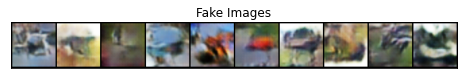

[10/40]   Loss_D:0.5278574228286743   Loss_G:2.8109023571014404


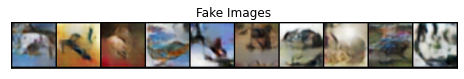

[15/40]   Loss_D:0.49020373821258545   Loss_G:1.6886415481567383


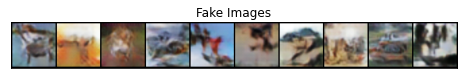

[20/40]   Loss_D:0.9268043041229248   Loss_G:0.5557518005371094


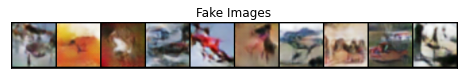

[25/40]   Loss_D:0.20885124802589417   Loss_G:2.071624279022217


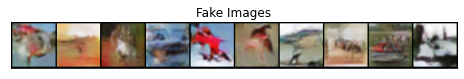

[30/40]   Loss_D:0.22294828295707703   Loss_G:1.9289546012878418


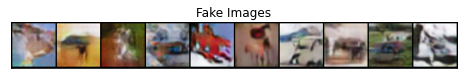

[35/40]   Loss_D:0.3381388187408447   Loss_G:2.109614849090576


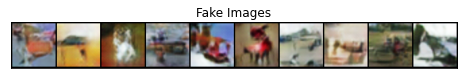

[40/40]   Loss_D:0.2254585325717926   Loss_G:2.6277036666870117


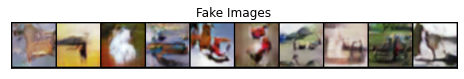

In [8]:
img_list = []
G_LOSS = []
D_LOSS = []
FID_score = []

for epoch in range(1,epochs+1):
    Disc_Model.train()
    Gen_Model.train()
    for i, (real, _) in enumerate(train_Dataloader):
        real = real.to(device)
        mb_size = real.size(0)
        
        ### TRAIN DISCRIMINATOR TO MAXIMIZE 
       
        noise = torch.randn(mb_size, z_dim, 1, 1).to(device)
        fake = Gen_Model(noise)
        
        #TRAIN WITH REAL IMAGES
        
        Disc_real = Disc_Model(real).view(-1)
        label = torch.ones_like(Disc_real)
        Disc_loss_real = criterion(Disc_real, label)
        
        #TRAIN WITH FAKE IMAGES
        
        disc_fake = Disc_Model(fake.detach()).view(-1)
        label = torch.zeros_like(disc_fake)
        Disc_loss_fake = criterion(disc_fake, label)
        lossDisc = (Disc_loss_real + Disc_loss_fake) / 2
        Disc_Model.zero_grad()
        lossDisc.backward()
        Disc_optimizer.step()
        
        
        ### TRAIN GENERATOR
        Gen_Model.zero_grad()
        label = torch.ones_like(Disc_real)
        output = Disc_Model(fake).view(-1)
        
        #CALCULATE GENERATOR'S LOSS
        lossG = criterion(output, label)
        lossG.backward()
        Gen_optimizer.step()
        G_LOSS.append(lossG.item())
        D_LOSS.append(lossDisc.item())
        
        if lossG.item==0.0:
            break   

    with torch.no_grad():
        Gen_Model.eval()
        fakes = Gen_Model(fixed_noise).detach().cpu()
        img_list.append(vutils.make_grid(fakes, padding=2, normalize=True, nrow=6))
    
    vutils.save_image(real.cpu(),'IMAGE_DATA/DCGAN_IMAGES/real/image{}.png'.format(epoch), nrow=10, normalize=True)
    vutils.save_image(fakes.cpu(),'IMAGE_DATA/DCGAN_IMAGES/fake/image{}.png'.format(epoch), nrow=10, normalize=True)
    
    if epoch%5 == 0:
        print(f'[{epoch}/{epochs}]   Loss_D:{lossDisc.item()}   Loss_G:{lossG.item()}')
        display_images(fakes[:10].cpu(), 'Fake Images', figsize=(8,8), nrow=10)

vutils.save_image(fakes[:10].cpu(),'IMAGE_DATA/dcganimage10.png', nrow=10)
vutils.save_image(fakes[:24].cpu(),'IMAGE_DATA/dcganimage.png')
vutils.save_image(fakes[:10].cpu(),'IMAGE_DATA/dcganimage10norm.png', nrow=10, normalize=True)
vutils.save_image(fakes[:24].cpu(),'IMAGE_DATA/dcganimagenorm.png', normalize=True)
torch.save(Gen_Model,'Models/dcgan.pth')  

losses = {'GenLoss': G_LOSS,
         'DiscLoss': D_LOSS}
with open('pickle/dcgan_loss.txt', 'wb') as f:
    pickle.dump(losses,f)

#SAVING GENERATED IMAGES FOR VISUALIZATION
with open('pickle/dcganImg.txt', 'wb') as f:
    pickle.dump(img_list,f)

### Plotting the Loss

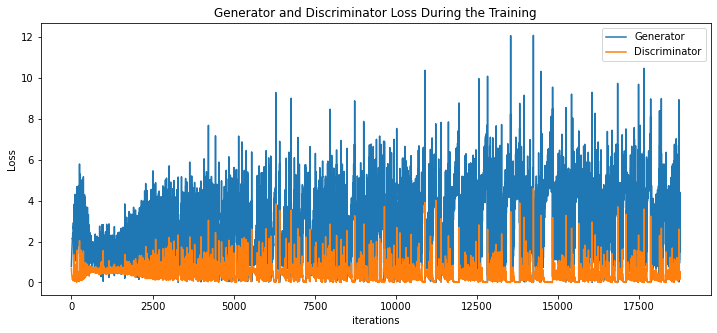

In [9]:
with open('pickle/dcgan_loss.txt', 'rb') as f:
    loss = pickle.load(f)
    
plt.figure(figsize=(12,5))
plt.title("Generator and Discriminator Loss During the Training")
plt.plot(loss['GenLoss'],label="Generator")
plt.plot(loss['DiscLoss'],label="Discriminator")
plt.xlabel("iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()

### Computing the FID Scores

In [10]:
from FID import fidScore
DCGAN_FID = []
for k in range(1,40):
    k = k+1
    fids = fidScore('IMAGE_DATA/DCGAN_IMAGES/real', 'IMAGE_DATA/DCGAN_IMAGES/fake',k,128)
    print(f'Epoch:{k} and FID Score: {fids}', end = '\r', flush=True)
    DCGAN_FID.append(fids)

with open('pickle/dcganfid.txt', 'wb') as f:
    pickle.dump(DCGAN_FID,f)

/home/akomati/.local/lib/python3.9/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/akomati/.local/lib/python3.9/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=Inception_V3_Weights.IMAGENET1K_V1`. You can also use `weights=Inception_V3_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/inception_v3_google-0cc3c7bd.pth" to /home/akomati/.cache/torch/hub/checkpoints/inception_v3_google-0cc3c7bd.pth
100%|██████████| 104M/104M [00:02<00:00, 37.9MB/s] 


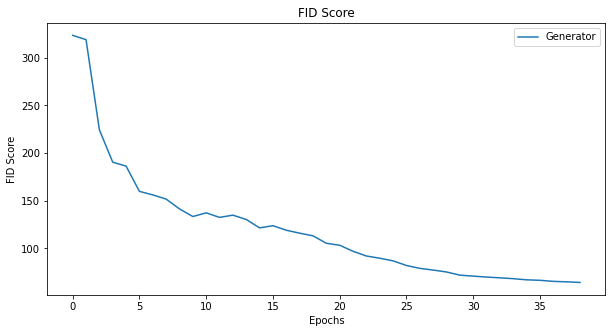

In [11]:
with open('pickle/dcganfid.txt', 'rb') as f:
    fid = pickle.load(f)
    
plt.figure(figsize=(10,5))
plt.title("FID Score")
plt.plot(fid,label="Generator")
plt.xlabel("Epochs")
plt.ylabel("FID Score")
plt.legend()
plt.show()

### Visualizing animation of the images generated at every epoch

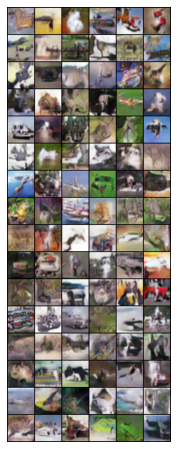

In [12]:
with open('pickle/dcganImg.txt', 'rb') as f:
    image_list = pickle.load(f)

fig = plt.figure(figsize=(8,8))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i.cpu(),(1,2,0)), animated=True)] for i in image_list]
ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)

HTML(ani.to_jshtml())